In [50]:
import pandas as pd
import json
import matplotlib.pyplot as plt

In [51]:
filename = 'output.json'
with open(filename, 'r', encoding = 'utf-8') as file:
    df = pd.DataFrame.from_dict(json.load(file), orient = 'index')

df.head()

,title,platforms,rating,votes,developer,release_date,price,genres
https://store.playstation.com/en-us/concept/228748,Fortnite,[PS5],4.32,6834029,Epic Games,7/21/2017,0.0,"[Action, Adventure]"
https://store.playstation.com/en-us/concept/10001130,Call of Duty®: Modern Warfare® III - Cross-Gen...,"[PS4, PS5]",4.04,324265,Activision,11/2/2023,69.99,[Action]
https://store.playstation.com/en-us/concept/10007788,NBA 2K24 Kobe Bryant Edition for PS5™,"[PS4, PS5]",3.03,30431,2K,9/8/2023,69.99,[Sport]
https://store.playstation.com/en-us/concept/10007176,EA SPORTS FC™ 24 Standard Edition PS4 & PS5,"[PS4, PS5]",3.34,74343,Electronic Arts Inc,9/29/2023,69.99,[Sport]
https://store.playstation.com/en-us/concept/10008651,MLB® The Show™ 24 PS5®,"[PS4, PS5]",3.90,1601,Sony Interactive Entertainment,3/19/2024,69.99,[Sport]


## Начнём очищать данные

### Удалим все пустые значения

In [52]:
df['url'] = df.index
df = df.reset_index(drop = True)
df.head()

,title,platforms,rating,votes,developer,release_date,price,genres,url
0,Fortnite,[PS5],4.32,6834029,Epic Games,7/21/2017,0.0,"[Action, Adventure]",https://store.playstation.com/en-us/concept/22...
1,Call of Duty®: Modern Warfare® III - Cross-Gen...,"[PS4, PS5]",4.04,324265,Activision,11/2/2023,69.99,[Action],https://store.playstation.com/en-us/concept/10...
2,NBA 2K24 Kobe Bryant Edition for PS5™,"[PS4, PS5]",3.03,30431,2K,9/8/2023,69.99,[Sport],https://store.playstation.com/en-us/concept/10...
3,EA SPORTS FC™ 24 Standard Edition PS4 & PS5,"[PS4, PS5]",3.34,74343,Electronic Arts Inc,9/29/2023,69.99,[Sport],https://store.playstation.com/en-us/concept/10...
4,MLB® The Show™ 24 PS5®,"[PS4, PS5]",3.90,1601,Sony Interactive Entertainment,3/19/2024,69.99,[Sport],https://store.playstation.com/en-us/concept/10...


In [53]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8995 entries, 0 to 8994
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   title         8995 non-null   object 
 1   platforms     8995 non-null   object 
 2   rating        8995 non-null   float64
 3   votes         8995 non-null   int64  
 4   developer     8995 non-null   object 
 5   release_date  8995 non-null   object 
 6   price         8995 non-null   object 
 7   genres        8995 non-null   object 
 8   url           8995 non-null   object 
dtypes: float64(1), int64(1), object(7)
memory usage: 632.6+ KB


In [54]:
for column in df.columns:
    display(df[column].value_counts())
    print()

title
Title Not Found                    3
Happy Drummer                      2
MediEvil                           2
Sushi Break                        2
Doctor Who: The Edge of Time       2
                                  ..
Doom & Destiny Worlds              1
I Expect You To Die                1
Strike Force 2 - Terrorist Hunt    1
Daymare: 1998                      1
Warstride Challenges               1
Name: count, Length: 8979, dtype: int64

platforms
[PS4]                                      5666
[PS4, PS5]                                 2722
[PS5]                                       583
[]                                            6
[PS5 Edition, PS4, PS5]                       4
[Standard Edition PS4 & PS5, PS4, PS5]        2
[Umurangi Generation PS5+VR2, PS4, PS5]       1
[PS4 + PS5, PS4, PS5]                         1
[PSVR2 Edition, PS5]                          1
[BAD DREAMS - PSVR Edition, PS4]              1
[PS4, Standard Edition (PS5), PS5]            1
[TRIPP (PS5), PS5]                            1
[Slayer Edition PS5, PS4, PS5]                1
[PS4, Standard Edition PS5, PS5]              1
[GRID Legends (PS5), PS4, PS5]                1
[Standard Edition PS5 & PS4, PS4, PS5]        1
[Warframe (PS5), PS4, PS5]                    1
[PS4 + PS5 + Avatars, PS4, PS5]               1
Name: count, dtype: int64

rating
4.00    181
4.50    114
5.00     99
4.33     97
4.11     89
       ... 
1.88      1
1.42      1
1.20      1
2.27      1
1.27      1
Name: count, Length: 344, dtype: int64

votes
6        93
11       92
19       91
8        90
9        90
         ..
39052     1
14191     1
2619      1
2790      1
1396      1
Name: count, Length: 2431, dtype: int64

developer
HAMSTER Corporation               371
Ratalaika Games SL                265
EastAsiaSoft                      207
Sony Interactive Entertainment    170
Smobile                           111
                                 ... 
Actoon Studio®                      1
NOBLE STEED GAMES PTY LTD           1
KILLHOUSE GAMES                     1
Stainless Games Ltd                 1
NextGen Interactions, LLC           1
Name: count, Length: 1762, dtype: int64

release_date
2/22/2023     45
11/12/2020    34
5/29/2018     22
10/28/2021    20
10/26/2023    20
              ..
5/1/2019       1
5/17/2018      1
7/5/2022       1
11/25/2020     1
12/21/2016     1
Name: count, Length: 2023, dtype: int64

price
19.99    1218
14.99     934
9.99      922
4.99      696
29.99     595
         ... 
8.09        1
23.49       1
11.09       1
12.24       1
15.49       1
Name: count, Length: 167, dtype: int64

genres
[Action]                                           875
[Adventure]                                        646
[]                                                 437
[Role Playing Games]                               344
[Shooter]                                          265
                                                  ... 
[Action, Driving/Racing, Simulation, Simulator]      1
[Family, Casual]                                     1
[Shooter, Action, Simulator]                         1
[Party, Family, Shooter]                             1
[Puzzle, Brain Training, Puzzle]                     1
Name: count, Length: 927, dtype: int64

url
https://store.playstation.com/en-us/concept/228748      1
https://store.playstation.com/en-us/concept/10006143    1
https://store.playstation.com/en-us/concept/10010054    1
https://store.playstation.com/en-us/concept/10009830    1
https://store.playstation.com/en-us/concept/10003560    1
                                                       ..
https://store.playstation.com/en-us/concept/234818      1
https://store.playstation.com/en-us/concept/233255      1
https://store.playstation.com/en-us/concept/201954      1
https://store.playstation.com/en-us/concept/10003927    1
https://store.playstation.com/en-us/concept/10005310    1
Name: count, Length: 8995, dtype: int64

Мы можем заметить, что для столбца votes есть игры, у которых количество голосов равно 0. Посмотрев на них подробнее мы можем заметить, что это те игры, которые выйдут в будущем. Мы их сохраним для будущего анализа в отдельный датафрейм и удалим из текущего.

### Удаление будущий игр и сохранение их в новый файл

In [55]:
future_games_df = df[df['votes'] == 0]
future_games_df.to_csv('future_games.csv', index = False)
future_games_df

,title,platforms,rating,votes,developer,release_date,price,genres,url
47,Star Wars Outlaws,[PS5],0.00,0,Ubisoft Entertainment,8/30/2024,69.99,[Adventure],https://store.playstation.com/en-us/concept/10...
87,SMITE 2 Founder's Edition,[PS5],0.00,0,Hi-Rez Studios,7/30/2024,29.99,"[Action, Strategy]",https://store.playstation.com/en-us/concept/10...
125,GUNDAM BREAKER 4 PS4® & PS5®,[PS5],0.00,0,Bandai Namco Entertainment America Inc.,8/29/2024,59.99,[Action],https://store.playstation.com/en-us/concept/10...
148,F1® 24 Champions Edition,"[PS4, PS5]",0.00,0,Electronic Arts Inc,5/28/2024,89.99,[Driving/Racing],https://store.playstation.com/en-us/concept/10...
168,Killer Klowns From Outer Space: The Game,[PS5],0.00,0,IllFonic Inc.,5/28/2024,39.99,"[Action, Horror]",https://store.playstation.com/en-us/concept/10...
179,Title Not Found,[],0.00,0,SQUARE ENIX CO. LTD.,3/27/2019,59.99,"[Role Playing Games, Action, Role Playing Games]",https://store.playstation.com/en-us/concept/20...
238,EARTH DEFENSE FORCE 6 PS4 & PS5,[PS5],0.00,0,D3PUBLISHER,7/24/2024,59.99,[Shooter],https://store.playstation.com/en-us/concept/10...
289,Slime Rancher 2,[PS5],0.00,0,"Monomi Park, LLC",6/7/2024,29.99,"[Action, Adventure]",https://store.playstation.com/en-us/concept/10...
322,Shin Megami Tensei V: Vengeance,[PS5],0.00,0,"SEGA of America, Inc.",6/14/2024,59.99,[Role Playing Games],https://store.playstation.com/en-us/concept/10...
452,Darkest Dungeon II: Oblivion Edition PS4 & PS5,[PS5],0.00,0,Red Hook Studios Inc.,7/15/2024,44.99,[Role Playing Games],https://store.playstation.com/en-us/concept/10...


In [56]:
df = df[df['votes'] != 0]
df.reset_index(drop = True, inplace = True)
df

,title,platforms,rating,votes,developer,release_date,price,genres,url
0,Fortnite,[PS5],4.32,6834029,Epic Games,7/21/2017,0.0,"[Action, Adventure]",https://store.playstation.com/en-us/concept/22...
1,Call of Duty®: Modern Warfare® III - Cross-Gen...,"[PS4, PS5]",4.04,324265,Activision,11/2/2023,69.99,[Action],https://store.playstation.com/en-us/concept/10...
2,NBA 2K24 Kobe Bryant Edition for PS5™,"[PS4, PS5]",3.03,30431,2K,9/8/2023,69.99,[Sport],https://store.playstation.com/en-us/concept/10...
3,EA SPORTS FC™ 24 Standard Edition PS4 & PS5,"[PS4, PS5]",3.34,74343,Electronic Arts Inc,9/29/2023,69.99,[Sport],https://store.playstation.com/en-us/concept/10...
4,MLB® The Show™ 24 PS5®,"[PS4, PS5]",3.90,1601,Sony Interactive Entertainment,3/19/2024,69.99,[Sport],https://store.playstation.com/en-us/concept/10...
...,...,...,...,...,...,...,...,...,...
8960,WarDogs: Red's Return,[PS4],3.98,292,QUByte Interactive,4/29/2021,3.99,[Action],https://store.playstation.com/en-us/concept/10...
8961,Warhedz,[PS4],2.95,38,Atom Republic,4/5/2016,4.99,[Strategy],https://store.playstation.com/en-us/concept/21...
8962,Warlock's Tower,[PS4],3.94,167,Ratalaika Games SL,5/28/2019,4.99,"[Action, Adventure, Puzzle]",https://store.playstation.com/en-us/concept/23...
8963,W.A.R.P.,[PS4],3.50,4,7 RAVEN STUDIOS CO. LTD.,2/17/2023,4.99,"[Action, Arcade]",https://store.playstation.com/en-us/concept/10...


### Удаление дубликатов

In [57]:
filtered_df = df[df.index != "Title Not Found"]

duplicated_titles = filtered_df.index.duplicated(keep = False)
duplicates = filtered_df.loc[duplicated_titles]

duplicates_dict = {}

for idx, row in duplicates.iterrows():
    if idx not in duplicates_dict:
        duplicates_dict[idx] = [row['url']]
    else:
        duplicates_dict[idx].append(row['url'])

duplicates_dict = sorted(duplicates_dict.items(), key = lambda x: x[0])

for key, value in duplicates_dict:
    print(f'Дубликат: {key} по ссылкам {" и ".join(value)}')

print(f'\nВсего дубликатов: {len(duplicates_dict)}')


Всего дубликатов: 0


### Теперь мы удалим те игры, данные у которых не найдены

In [58]:
df = df[df['title'] != "Title Not Found"]
df = df[df['developer'] != "Developer Not Found"]
df = df[df['rating'] != "Rating Not Found"]
df = df[df['votes'] != "Votes Not Found"]
df = df[df['price'] != "Price Not Found"]
df = df[df['release_date'] != "Release Date Not Found"]

### Проверка на то, какие типы у нас в df

In [59]:
df['rating'] = df['rating'].astype(float)
df['votes'] = df['votes'].astype(int)
df['developer'] = df['developer'].astype(str)
df['release_date'] = pd.to_datetime(df['release_date'])
df['price'] = df['price'].astype(float)
df['url'] = df['url'].astype(str)

print(df.dtypes)

title                   object
platforms               object
rating                 float64
votes                    int64
developer               object
release_date    datetime64[ns]
price                  float64
genres                  object
url                     object
dtype: object


### Изменение игр на более точную информацию по ним 

In [60]:
def map_platform(platform):
    platform = [i.lower() for i in platform]
    if 'ps4' in platform and 'ps5' in platform:
        return ['PS4', 'PS5']
    elif 'ps4' in platform:
        return ['PS4']
    elif 'ps5' in platform:
        return ['PS5']
    return platform


df['platforms'] = df['platforms'].apply(map_platform)

# Графики

## После проделанной работы мы можем начать анализировать данные

### Итоговый датафрейм

In [61]:
df.head()

,title,platforms,rating,votes,developer,release_date,price,genres,url
0,Fortnite,[PS5],4.32,6834029,Epic Games,2017-07-21,0.00,"[Action, Adventure]",https://store.playstation.com/en-us/concept/22...
1,Call of Duty®: Modern Warfare® III - Cross-Gen...,"[PS4, PS5]",4.04,324265,Activision,2023-11-02,69.99,[Action],https://store.playstation.com/en-us/concept/10...
2,NBA 2K24 Kobe Bryant Edition for PS5™,"[PS4, PS5]",3.03,30431,2K,2023-09-08,69.99,[Sport],https://store.playstation.com/en-us/concept/10...
3,EA SPORTS FC™ 24 Standard Edition PS4 & PS5,"[PS4, PS5]",3.34,74343,Electronic Arts Inc,2023-09-29,69.99,[Sport],https://store.playstation.com/en-us/concept/10...
4,MLB® The Show™ 24 PS5®,"[PS4, PS5]",3.90,1601,Sony Interactive Entertainment,2024-03-19,69.99,[Sport],https://store.playstation.com/en-us/concept/10...


У нас есть данные:

 - title – название игры. Данные в формате – строка
 - platforms – платформы, на которых доступна игра. Данные в формате – список строк
 - rating – рейтинг игры. Данные в формате – вещественное число
 - votes – количество голосов. Данные в формате – целое число
 - developer – разработчик игры. Данные в формате – строка
 - release_date – дата выхода игры. Данные в формате – дата
 - price – цена игры в $. Данные в формате – вещественное число
 - genres – жанры игры. Данные в формате – список строк
 - url – ссылка на игру. Данные в формате – строка

Рассмотрим следующие зависимости:
    
- Распределение рейтинга
- Распределение количества голосов
- Распределение цен
- Распределение даты выхода игр по месяцам
- Распределение жанров
- Распределение платформ
- Распределение игр по разработчикам
- Распределение дохода по разработчикам
- Зависимость рейтинга от количества голосов
- Зависимость рейтинга от цены
- Зависимость рейтинга от даты выхода игры
- Зависимость рейтинга от жанра
- Зависимость рейтинга от платформы
- Зависимость рейтинга от разработчика
- Зависимость количества голосов от цены
- Зависимость количества голосов от даты выхода игры
- Зависимость количества голосов от жанра
- Зависимость количества голосов от платформы
- Зависимость цены от даты выхода игры
- Зависимость цены от жанра
- Зависимость цены от платформы
- Зависимость цены от разработчика
- Зависимость даты выхода игры от жанра
- Зависимость даты выхода игры от платформы
- Зависимость жанра от платформы

## Распределение каждого столбца

### Посмотрим на распределение рейтинга

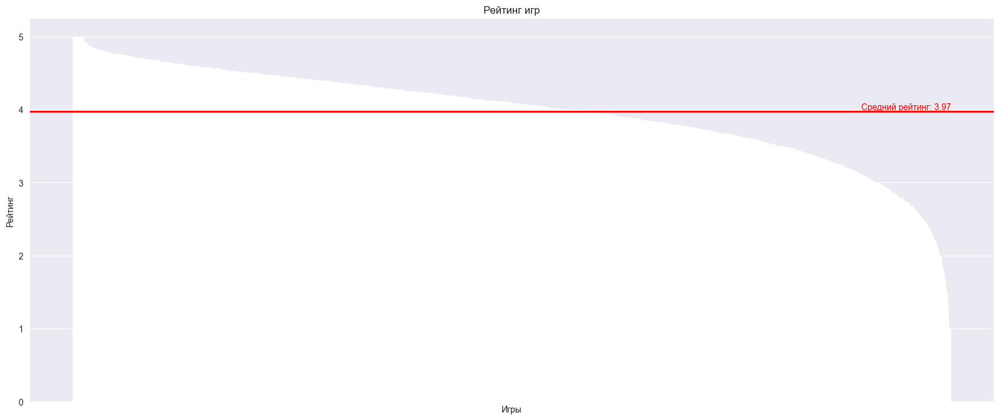

In [62]:
df = df.sort_values('rating', ascending = False)

plt.figure(figsize = (20, 8))
bars = plt.bar(df['title'], df['rating'], color = 'blue')

mean_rating = df['rating'].mean()
plt.axhline(y = mean_rating, color = 'r', linestyle = '-', linewidth = 2)
plt.text(len(df.index) - 1, mean_rating, f'Средний рейтинг: {mean_rating:.2f}', color = 'red',
         va = 'bottom', ha = 'right')

plt.title('Рейтинг игр')
plt.xlabel('Игры')
plt.ylabel('Рейтинг')

plt.xticks([])

plt.show()

### Посмотрим на распределение количества голосов

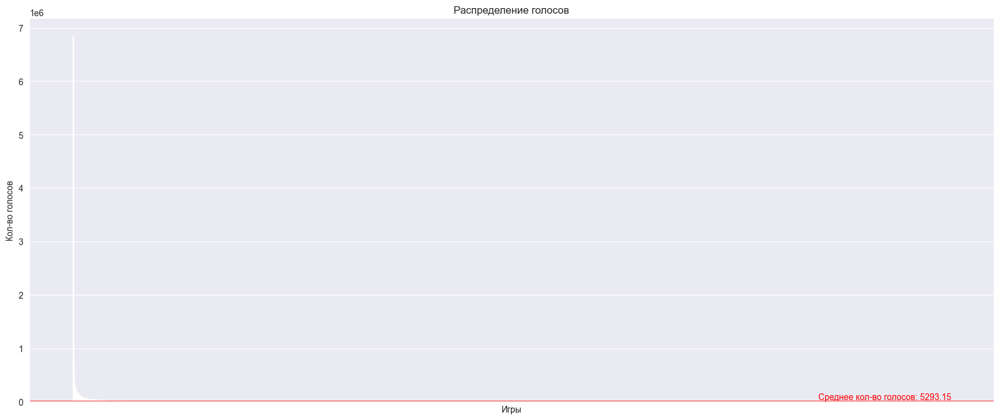

In [63]:
df = df.sort_values('votes', ascending = False)

plt.figure(figsize = (20, 8))
bars = plt.bar(df['title'], df['votes'], color = 'blue')

mean_rating = df['votes'].mean()
plt.axhline(y = mean_rating, color = 'r', linestyle = '-', linewidth = 2)
plt.text(len(df.index) - 1, mean_rating, f'Среднее кол-во голосов: {mean_rating:.2f}',
         color = 'red',
         va = 'bottom', ha = 'right')

plt.title('Распределение голосов')
plt.xlabel('Игры')
plt.ylabel('Кол-во голосов')

plt.xticks([])

plt.show()

Мы можем заметить, что есть игры, у которых количество голосов сильно выше, чем у остальных. Посмотрим на них подробнее.


In [64]:
filter_currency = 100000

In [65]:
filtered_df = df[df['votes'] > filter_currency]['title']

print(
    f"Мы можем заметить, что у игр {', '.join(filtered_df)} кол-во голосов сильно выше, чем у остальных игр")

Мы можем заметить, что у игр Fortnite, Minecraft, Call of Duty®: Modern Warfare®, Rocket League®, Apex Legends™ PS5™, Grand Theft Auto Online (PlayStation®5), Warframe®, The Last Of Us™ Remastered, Blacklight: Retribution, Call of Duty®: Black Ops III - Zombies Chronicles Edition, DC Universe Online Free to Play, War Thunder, Genshin Impact, Call of Duty®: Modern Warfare® III - Cross-Gen Bundle, Fall Guys, Destiny 2 PS4™ & PS5™, Roblox, eFootball™ 2024, Call of Duty®: Infinite Warfare, World of Tanks Modern Armor, Destiny - The Collection, Brawlhalla, Tom Clancy's Rainbow Six® Siege Deluxe Edition, The Crew® 2, Red Dead Redemption 2, Paladins, Bloodborne™, God of War, DRAGON BALL XENOVERSE 2, Battlefield 4™, The Witcher 3: Wild Hunt – Complete Edition, Call of Duty®: Black Ops Cold War - Cross-Gen Bundle PS4® & PS5®, H1Z1: Battle Royale, Marvel's Spider-Man Remastered, Rec Room, Overwatch 2 – Season 10: Venture Forth, ARK: Survival Evolved, Trove, Warface: Clutch, LittleBigPlanet™ 3, U

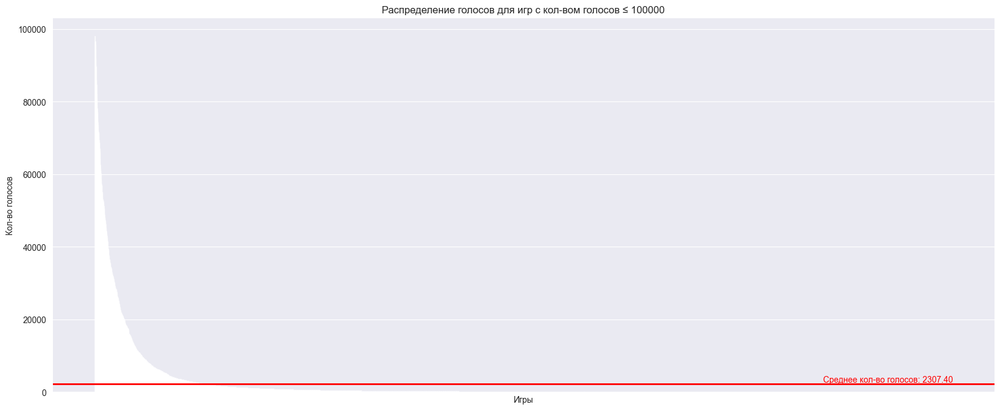

In [66]:
filtered_df = df[df['votes'] <= filter_currency]

plt.figure(figsize = (20, 8))
bars = plt.bar(filtered_df['title'], filtered_df['votes'], color = 'blue')

mean_rating = filtered_df['votes'].mean()
plt.axhline(y = mean_rating, color = 'r', linestyle = '-', linewidth = 2)
plt.text(len(filtered_df.index) - 1, mean_rating, f'Среднее кол-во голосов: {mean_rating:.2f}',
         color = 'red',
         va = 'bottom', ha = 'right')

plt.title(f'Распределение голосов для игр с кол-вом голосов ≤ {filter_currency}')
plt.xlabel('Игры')
plt.ylabel('Кол-во голосов')

plt.xticks([])

plt.show()

### Посмотрим на распределение цен

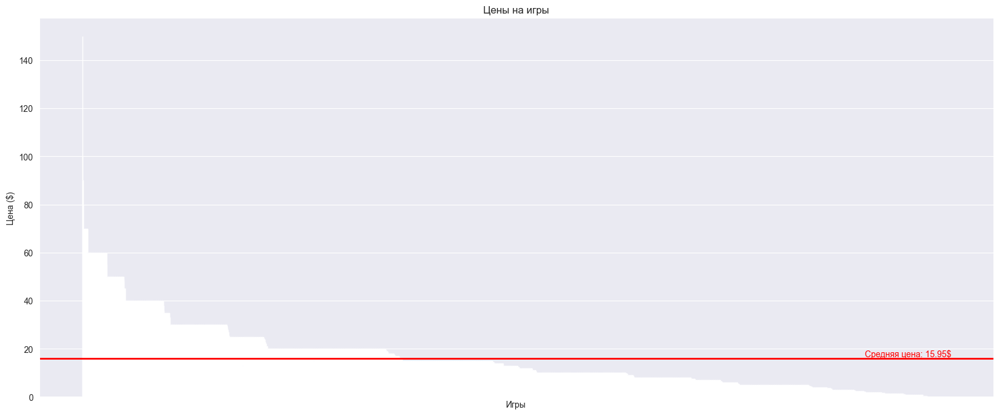

In [67]:
df = df.sort_values('price', ascending = False)

plt.figure(figsize = (20, 8))
bars = plt.bar(df['title'], df['price'], color = 'blue')

mean_rating = df['price'].mean()
plt.axhline(y = mean_rating, color = 'r', linestyle = '-', linewidth = 2)
plt.text(len(df.index) - 1, mean_rating, f'Средняя цена: {mean_rating:.2f}$', color = 'red',
         va = 'bottom', ha = 'right')

plt.title('Цены на игры')
plt.xlabel('Игры')
plt.ylabel('Цена ($)')

plt.xticks([])

plt.show()

### Посмотрим на распределение даты выхода игр по месяцам

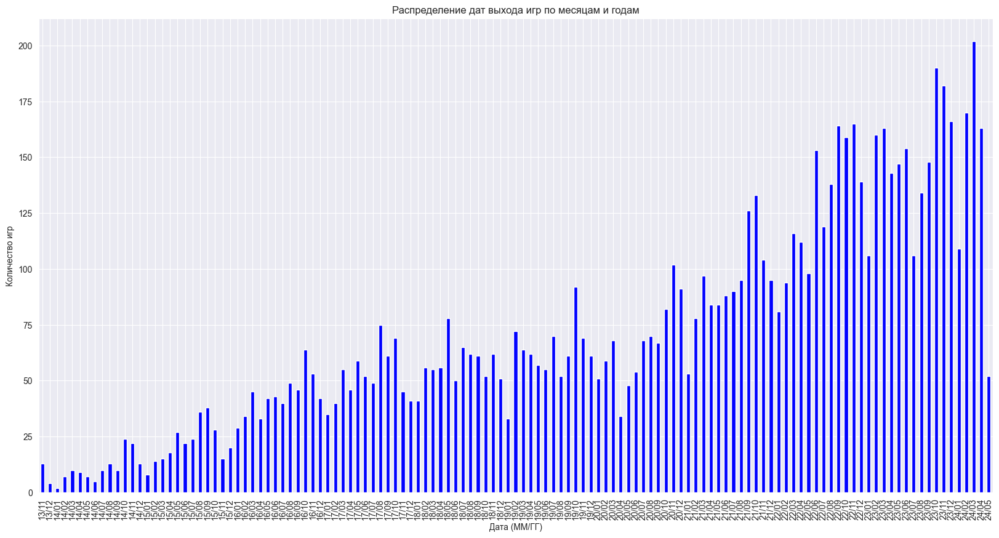

In [68]:
df['month_year'] = df['release_date'].dt.strftime('%y/%m')
monthly_yearly_releases = df['month_year'].value_counts().sort_index()

plt.figure(figsize = (20, 10))
monthly_yearly_releases.plot(kind = 'bar', color = 'blue')
plt.title('Распределение дат выхода игр по месяцам и годам')
plt.xlabel('Дата (ММ/ГГ)')
plt.ylabel('Количество игр')
plt.xticks(rotation = 90)
plt.show()

### Посмотрим на распределение жанров

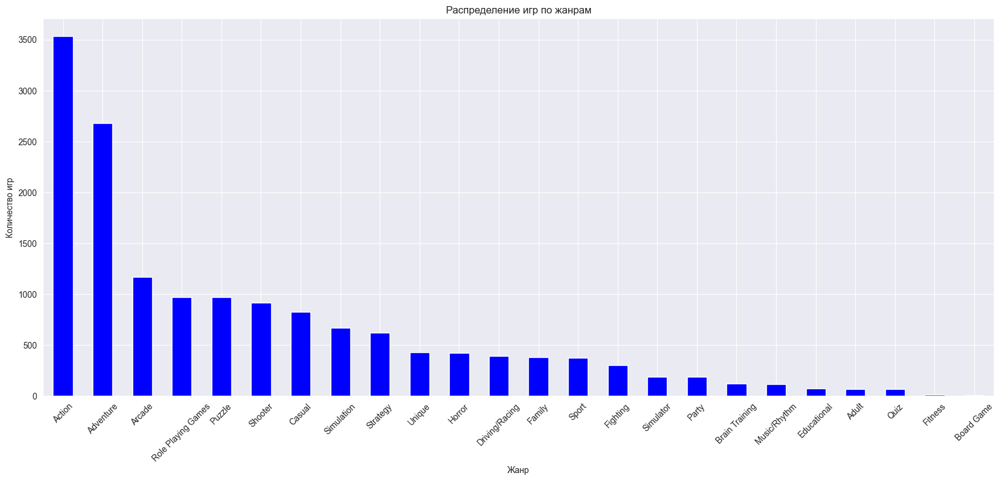

In [69]:
genres_expanded = df.explode('genres')

genre_counts = genres_expanded['genres'].value_counts()

plt.figure(figsize = (20, 8))
genre_counts.plot(kind = 'bar', color = 'blue')
plt.title('Распределение игр по жанрам')
plt.xlabel('Жанр')
plt.ylabel('Количество игр')
plt.xticks(rotation = 45)
plt.show()

### Посмотрим на распределение платформ

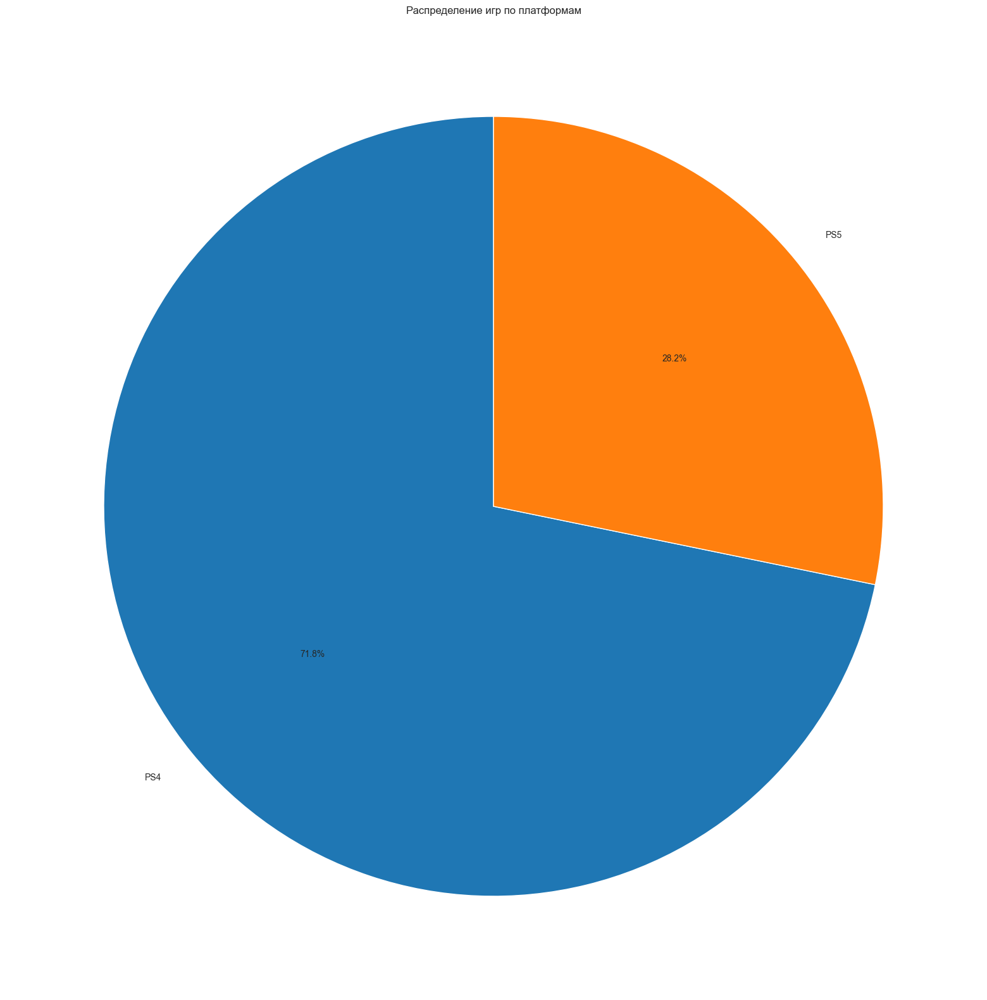

In [70]:
platform_expanded = df.explode('platforms')

platform_counts = platform_expanded['platforms'].value_counts()

plt.figure(figsize = (20, 20))
plt.pie(platform_counts, labels = platform_counts.index, autopct = '%1.1f%%', startangle = 90)
plt.title('Распределение игр по платформам')
plt.show()

### Посмотрим на распределение разработчиков

In [71]:
developers_percent = 0.008

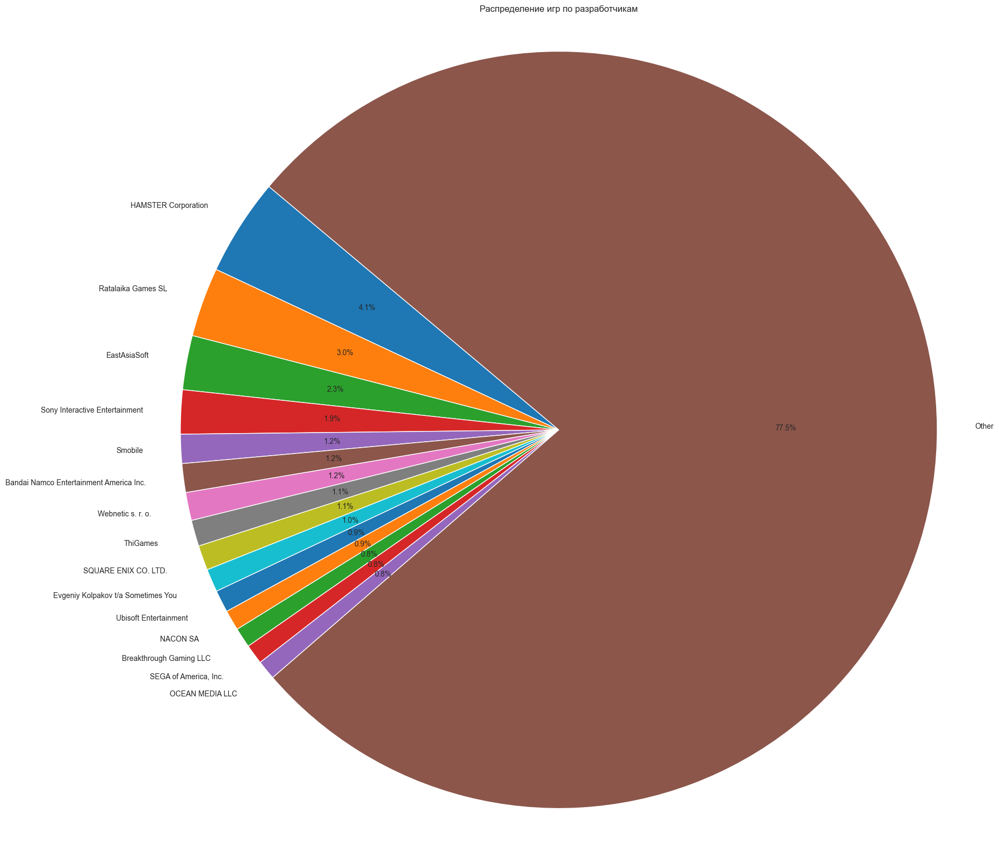

In [72]:
developer_counts = df['developer'].value_counts()

developer_counts_df = developer_counts.reset_index()
developer_counts_df.columns = ['developer', 'count']

total_games = developer_counts_df['count'].sum()
threshold = developers_percent * total_games

developer_counts_df['developer'] = developer_counts_df.apply(
    lambda x: 'Other' if x['count'] < threshold else x['developer'], axis = 1)

final_counts = developer_counts_df.groupby('developer')['count'].sum()

final_counts = final_counts.drop('Other', errors = 'ignore')
final_counts = final_counts.sort_values(ascending = False)
final_counts['Other'] = developer_counts_df.loc[
    developer_counts_df['developer'] == 'Other', 'count'].sum()

plt.figure(figsize = (20, 20))
pie = plt.pie(final_counts, labels = final_counts.index, autopct = '%1.1f%%', startangle = 140)
plt.title('Распределение игр по разработчикам')

plt.axis('equal')
plt.show()

### Посмотрим на распределение дохода по разработчикам

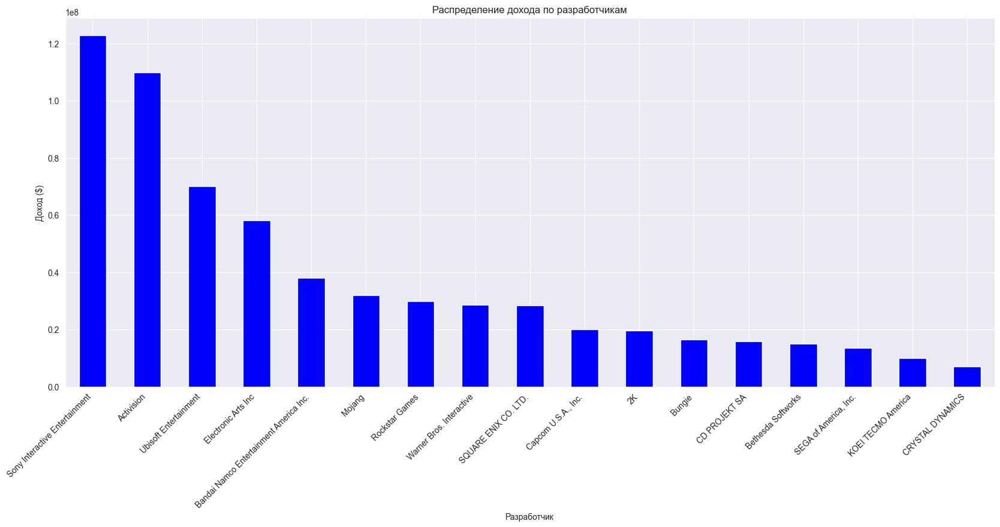

In [73]:
df['revenue'] = df['price'] * df['votes']

developer_revenue = df.groupby('developer')['revenue'].sum()

developer_revenue_df = developer_revenue.reset_index()
developer_revenue_df.columns = ['developer', 'revenue']

total_revenue = developer_revenue_df['revenue'].sum()

threshold = developers_percent * total_revenue

developer_revenue_df['developer'] = developer_revenue_df.apply(
    lambda x: 'Other' if x['revenue'] < threshold else x['developer'], axis = 1)

final_revenue = developer_revenue_df.groupby('developer')['revenue'].sum()

final_revenue = final_revenue.drop('Other', errors = 'ignore')

final_revenue = final_revenue[final_revenue / total_revenue > developers_percent]
final_revenue.sort_values(ascending = False).plot(kind = 'bar', figsize = (20, 8),
                                                  color = 'blue')
plt.title('Распределение дохода по разработчикам')
plt.xlabel('Разработчик')
plt.ylabel('Доход ($)')
plt.xticks(rotation = 45, ha = 'right')
plt.show()

## Зависимости рейтинга от других переменных

### Зависимость рейтинга от количества голосов

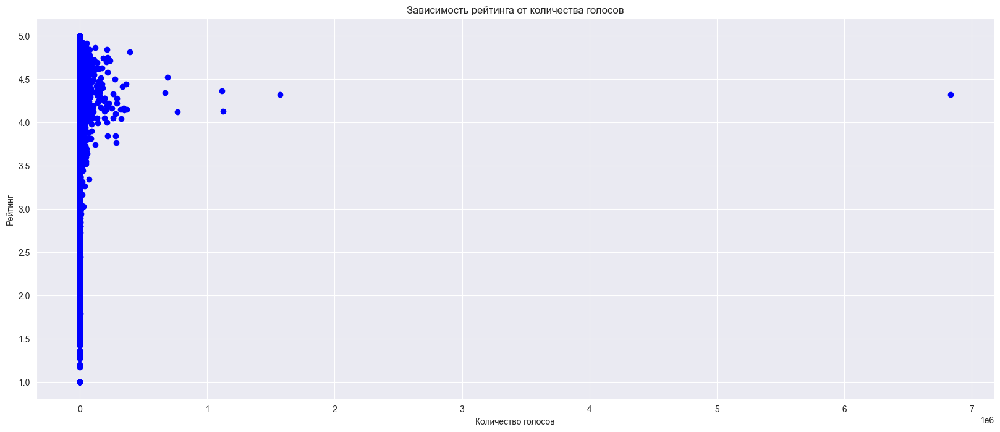

In [74]:
plt.figure(figsize = (20, 8))
plt.scatter(df['votes'], df['rating'], color = 'blue')
plt.title('Зависимость рейтинга от количества голосов')
plt.xlabel('Количество голосов')
plt.ylabel('Рейтинг')
plt.grid(True)
plt.show()

Заметим, что мы снова столкнулись с проблемой того, что есть игры со слишком большим кол-во отзывов 

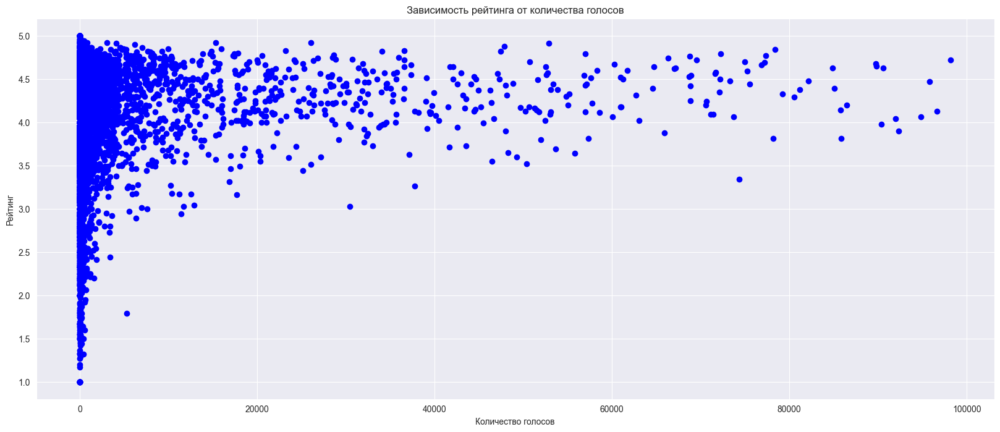

In [75]:
filter_votes = 100000

plt.figure(figsize = (20, 8))
plt.scatter(filtered_df['votes'], filtered_df['rating'], color = 'blue')
plt.title('Зависимость рейтинга от количества голосов')
plt.xlabel('Количество голосов')
plt.ylabel('Рейтинг')
plt.grid(True)
plt.show()

### Зависимость рейтинга от цены

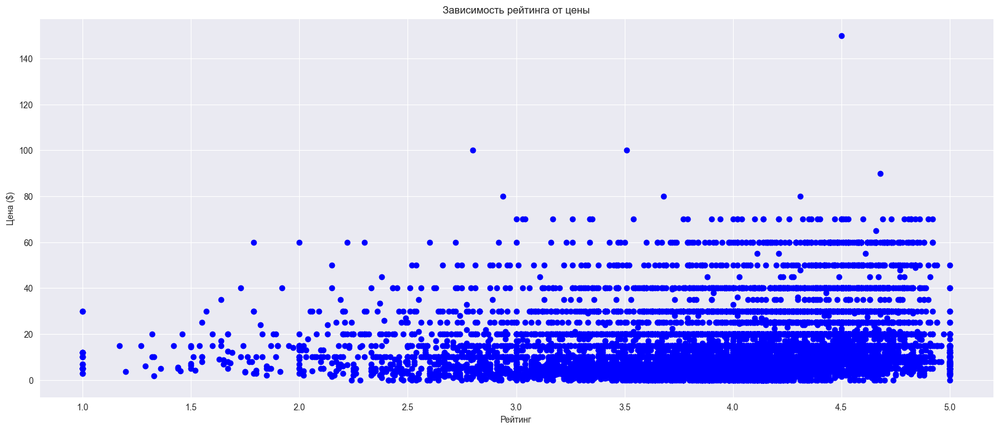

In [76]:
plt.figure(figsize = (20, 8))
plt.scatter(df['rating'], df['price'], color = 'blue')
plt.title('Зависимость рейтинга от цены')
plt.xlabel('Рейтинг')
plt.ylabel('Цена ($)')
plt.grid(True)
plt.show()

### Зависимость рейтинга от даты выхода игры

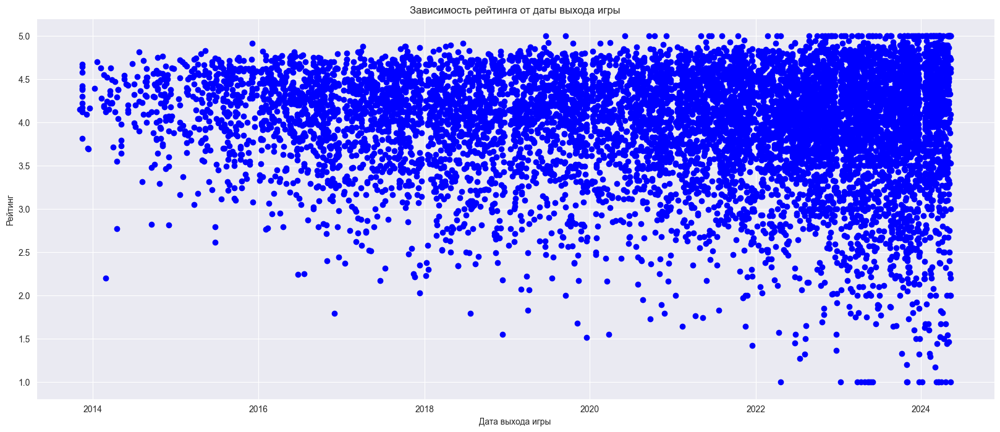

In [77]:
plt.figure(figsize = (20, 8))
plt.scatter(df['release_date'], df['rating'], color = 'blue')
plt.title('Зависимость рейтинга от даты выхода игры')
plt.xlabel('Дата выхода игры')
plt.ylabel('Рейтинг')
plt.grid(True)
plt.show()

### Зависимость рейтинга от жанра

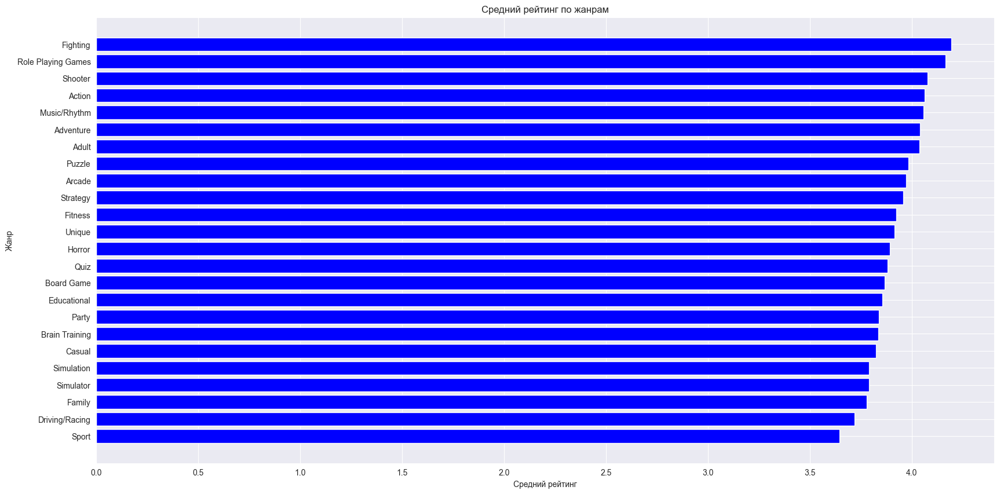

In [78]:
genre_rating = genres_expanded.groupby('genres')['rating'].mean().sort_values()

plt.figure(figsize = (20, 10))
plt.barh(genre_rating.index, genre_rating.values, color = 'blue')
plt.title('Средний рейтинг по жанрам')
plt.xlabel('Средний рейтинг')
plt.ylabel('Жанр')
plt.grid(True, axis = 'x')
plt.show()

### Зависимость рейтинга от платформы

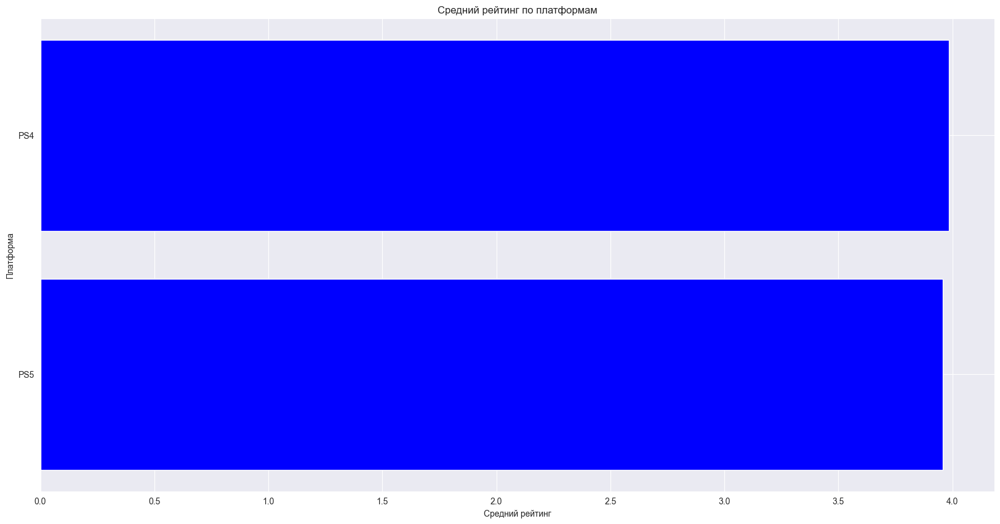

In [79]:
platform_rating = platform_expanded.groupby('platforms')['rating'].mean().sort_values()

plt.figure(figsize = (20, 10))
plt.barh(platform_rating.index, platform_rating.values, color = 'blue')
plt.title('Средний рейтинг по платформам')
plt.xlabel('Средний рейтинг')
plt.ylabel('Платформа')
plt.grid(True, axis = 'x')
plt.show()

### Зависимость рейтинга от разработчика

findfont: Font family 'Noto_Sans_JP/NotoSansJP-VariableFont_wght.ttf' not found.
findfont: Font family 'Noto_Sans_JP/NotoSansJP-VariableFont_wght.ttf' not found.
findfont: Font family 'Noto_Sans_JP/NotoSansJP-VariableFont_wght.ttf' not found.
findfont: Font family 'Noto_Sans_JP/NotoSansJP-VariableFont_wght.ttf' not found.
findfont: Font family 'Noto_Sans_JP/NotoSansJP-VariableFont_wght.ttf' not found.
findfont: Font family 'Noto_Sans_JP/NotoSansJP-VariableFont_wght.ttf' not found.
findfont: Font family 'Noto_Sans_JP/NotoSansJP-VariableFont_wght.ttf' not found.
findfont: Font family 'Noto_Sans_JP/NotoSansJP-VariableFont_wght.ttf' not found.
findfont: Font family 'Noto_Sans_JP/NotoSansJP-VariableFont_wght.ttf' not found.
findfont: Font family 'Noto_Sans_JP/NotoSansJP-VariableFont_wght.ttf' not found.
findfont: Font family 'Noto_Sans_JP/NotoSansJP-VariableFont_wght.ttf' not found.
findfont: Font family 'Noto_Sans_JP/NotoSansJP-VariableFont_wght.ttf' not found.
findfont: Font family 'Noto_

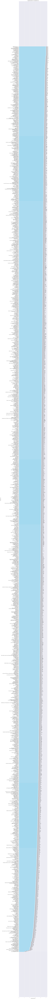

In [95]:
plt.rcParams['font.family'] = 'Noto_Sans_JP/NotoSansJP-VariableFont_wght.ttf'

developer_rating = df.groupby('developer').agg({'rating': 'mean', 'votes': 'sum'}).sort_values(
    by = 'rating')

plt.figure(figsize = (10, len(developer_rating) * 0.2))

bars = plt.barh(developer_rating.index, developer_rating['rating'], color = 'skyblue')

for bar, votes in zip(bars, developer_rating['votes']):
    plt.text(bar.get_width() + 0.05, bar.get_y() + bar.get_height() / 2, f'Votes: {votes}',
             va = 'center')

plt.title('Средний рейтинг по разработчику')
plt.xlabel('Средний рейтинг')
plt.ylabel('Разработчик')

plt.show()

Можем заметить, что есть разработчики, которые получили высокий рейтинг, так как за них проголосовали мало людей. Посмотрим на разработчиков, у которых количество голосов больше 100

Так же можно заметить, что при отрисовки графика возникают ошибки. Они связаны с тем, что есть разработчики из Азии, которые в своём названии использую иероглифы

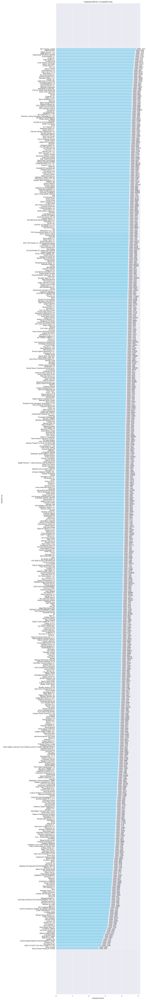

In [81]:
developer_rating_filtered = developer_rating[developer_rating['votes'] >= 1000].sort_values(
    by = 'rating')

plt.figure(figsize = (10, len(developer_rating_filtered) * 0.2))

bars = plt.barh(developer_rating_filtered.index, developer_rating_filtered['rating'],
                color = 'skyblue')

for bar, votes in zip(bars, developer_rating_filtered['votes']):
    plt.text(bar.get_width() + 0.05, bar.get_y() + bar.get_height() / 2, f'Votes: {votes}',
             va = 'center')

plt.title('Средний рейтинг по разработчику')
plt.xlabel('Средний рейтинг')
plt.ylabel('Разработчик')

plt.show()

## Зависимости количества голосов от других переменных

### Зависимость количества голосов от цены

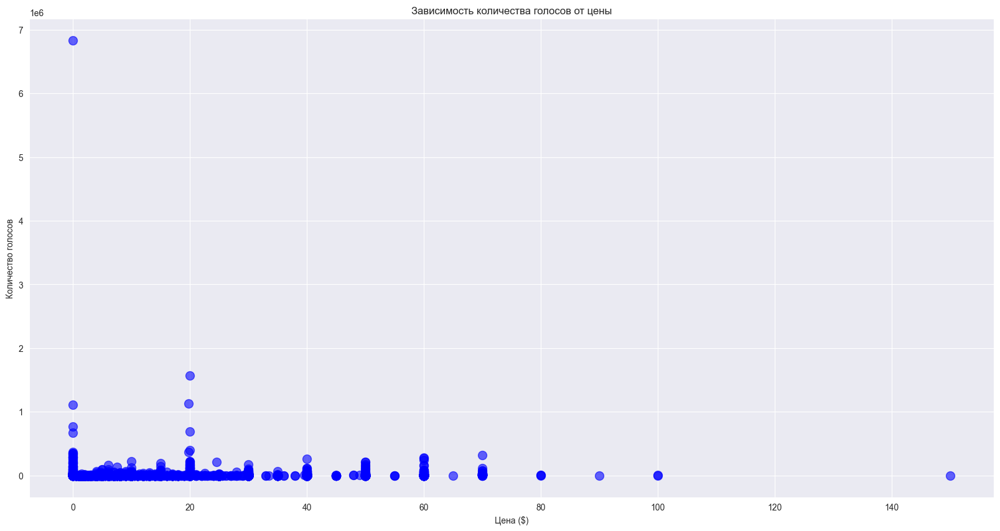

In [82]:
plt.figure(figsize = (20, 10))
plt.scatter(df["price"], df["votes"], color = 'blue', s = 100, alpha = 0.6)
plt.title("Зависимость количества голосов от цены")
plt.xlabel("Цена ($)")
plt.ylabel("Количество голосов")
plt.grid(True)
plt.show()

### Зависимость количества голосов от даты выхода игр

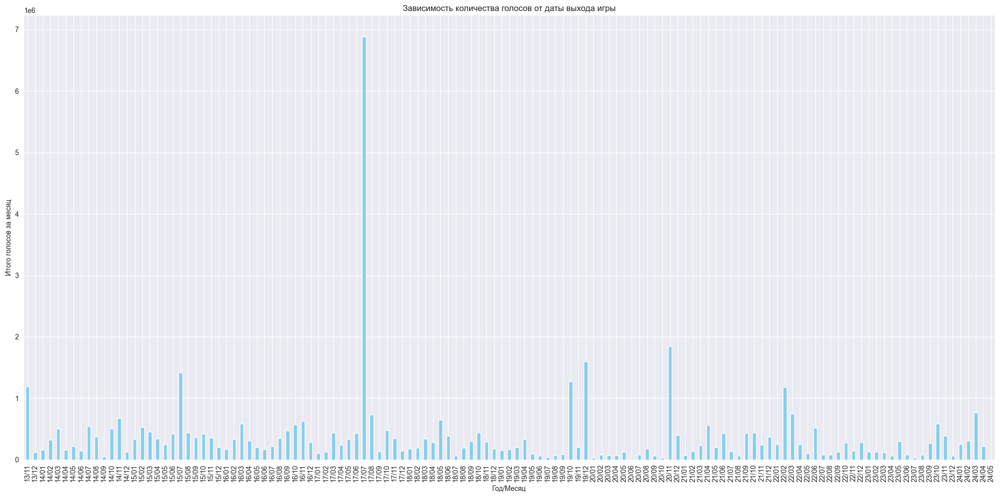

In [83]:
df['release_date'] = pd.to_datetime(df['release_date'])

df['month_year'] = df['release_date'].dt.strftime('%y/%m')
monthly_yearly_votes = df.groupby('month_year')['votes'].sum().sort_index()

plt.figure(figsize = (20, 10))
monthly_yearly_votes.plot(kind = 'bar', color = 'skyblue')
plt.title('Зависимость количества голосов от даты выхода игры')
plt.xlabel('Год/Месяц')
plt.ylabel('Итого голосов за месяц')
plt.grid(True)
plt.xticks(rotation = 90)
plt.tight_layout()
plt.show()

### Зависимость количества голосов от жанра

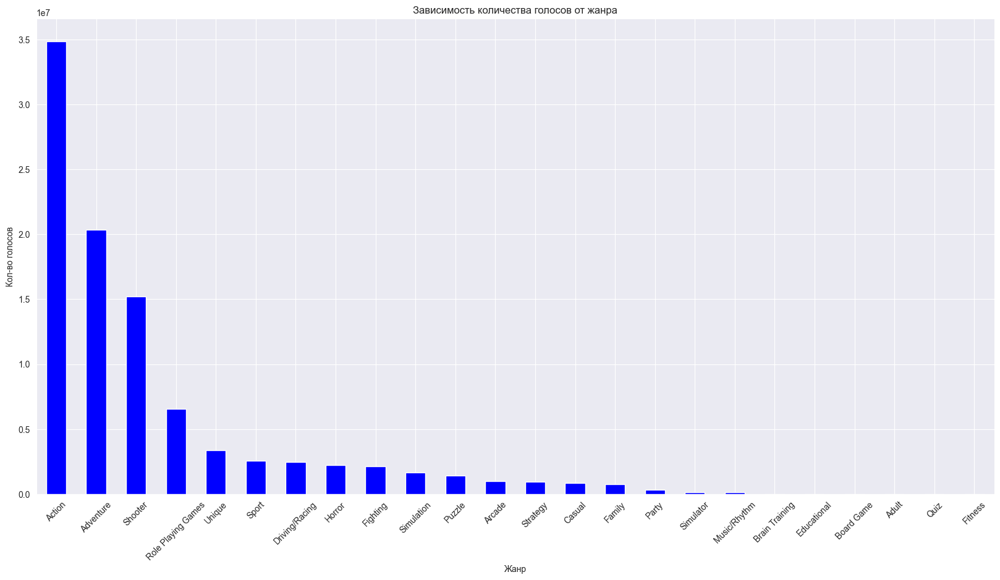

In [84]:
df_expanded = df.explode('genres')

genre_votes = df_expanded.groupby('genres')['votes'].sum().sort_values(ascending = False)

plt.figure(figsize = (20, 10))
genre_votes.plot(kind = 'bar', color = 'blue')
plt.title("Зависимость количества голосов от жанра")
plt.xlabel("Жанр")
plt.ylabel("Кол-во голосов")
plt.xticks(rotation = 45)
plt.grid(True)
plt.show()


### Зависимость количества голосов от платформы

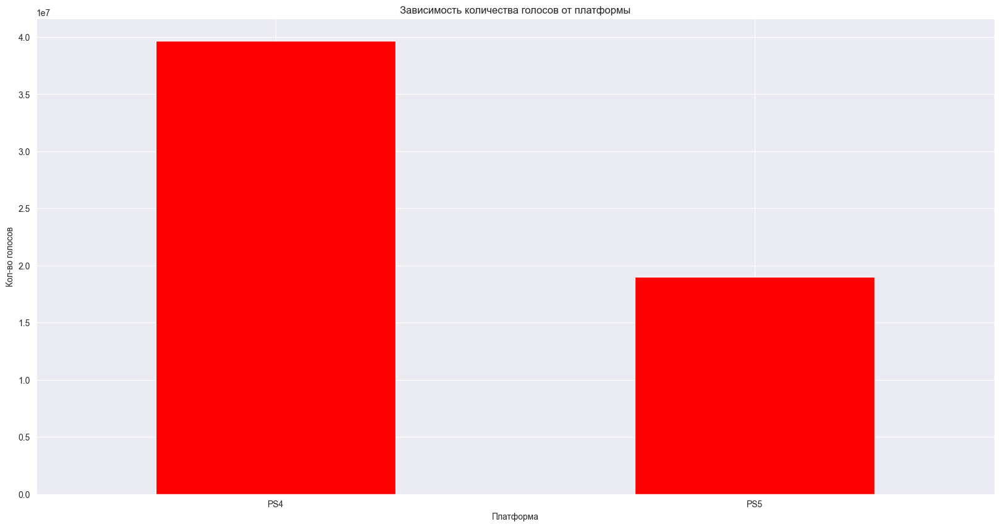

In [85]:
df_expanded_platforms = df.explode('platforms')

platform_votes = df_expanded_platforms.groupby('platforms')['votes'].sum().sort_values(
    ascending = False)

plt.figure(figsize = (20, 10))
platform_votes.plot(kind = 'bar', color = 'red')
plt.title("Зависимость количества голосов от платформы")
plt.xlabel("Платформа")
plt.ylabel("Кол-во голосов")
plt.xticks(rotation = 0)
plt.grid(True)
plt.show()


## Зависимости цены от других переменных

### Зависимость цены от даты выхода игры

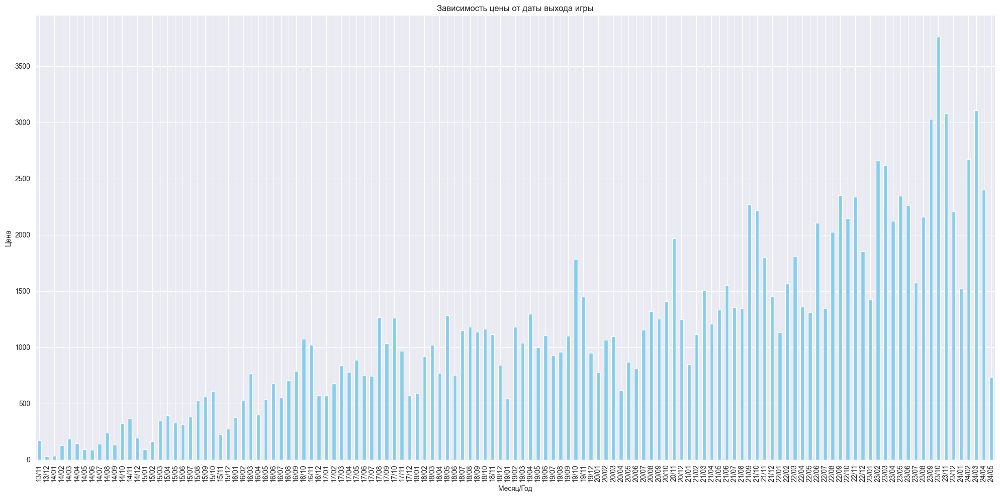

In [86]:
df['release_date'] = pd.to_datetime(df['release_date'])

df['month_year'] = df['release_date'].dt.strftime('%y/%m')
monthly_yearly_votes = df.groupby('month_year')['price'].sum().sort_index()

plt.figure(figsize = (20, 10))
monthly_yearly_votes.plot(kind = 'bar', color = 'skyblue')
plt.title('Зависимость цены от даты выхода игры')
plt.xlabel('Месяц/Год')
plt.ylabel('Цена')
plt.grid(True)
plt.xticks(rotation = 90)
plt.tight_layout()
plt.show()

### Зависимость цены от жанра

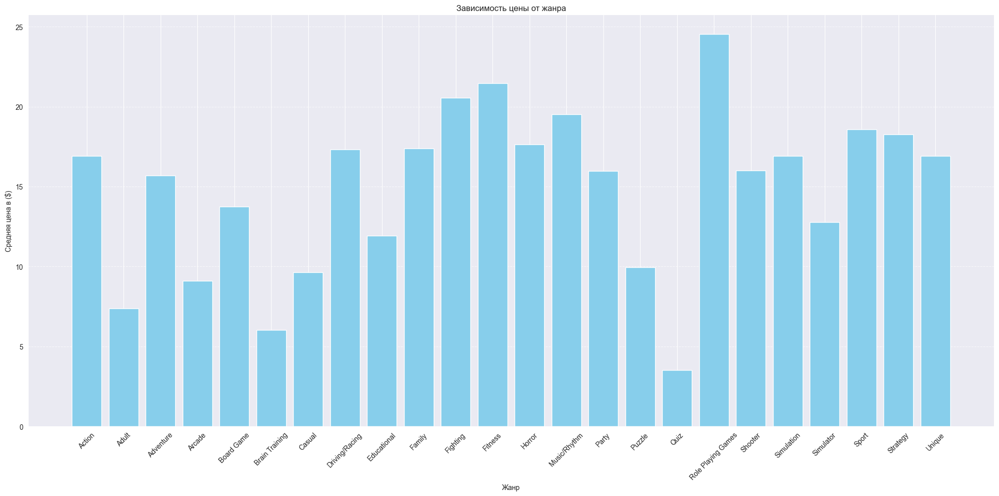

In [87]:
genre_price = genres_expanded.groupby('genres')['price'].mean().reset_index()

plt.figure(figsize = (20, 10))
plt.bar(genre_price['genres'], genre_price['price'], color = 'skyblue')
plt.xlabel('Жанр')
plt.ylabel('Средняя цена в ($)')
plt.title('Зависимость цены от жанра')
plt.grid(axis = 'y', linestyle = '--', alpha = 0.7)
plt.xticks(rotation = 45)
plt.tight_layout()
plt.show()

### Зависимость цены от платформы

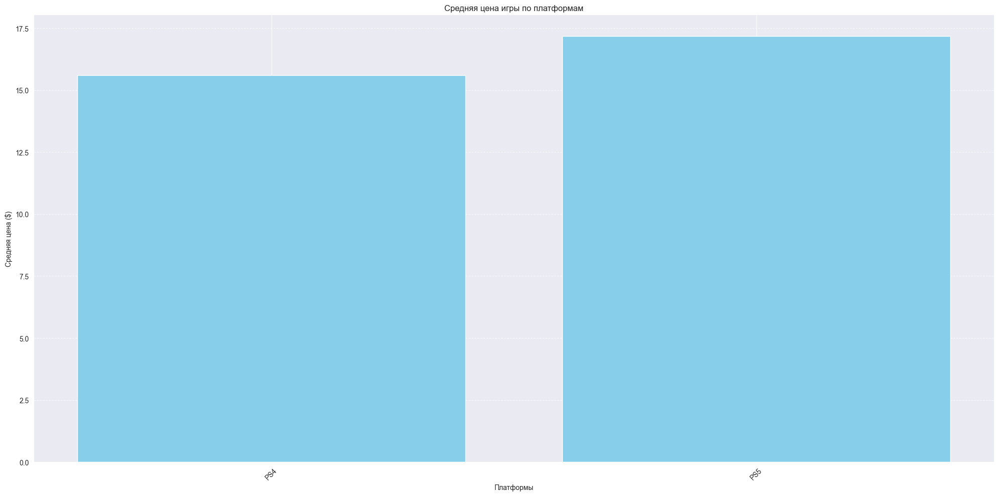

In [88]:
platform_price = platform_expanded.groupby('platforms')['price'].mean().reset_index()

plt.figure(figsize = (20, 10))
plt.bar(platform_price['platforms'], platform_price['price'], color = 'skyblue')
plt.xlabel('Платформы')
plt.ylabel('Средняя цена ($)')
plt.title('Средняя цена игры по платформам')
plt.grid(axis = 'y', linestyle = '--', alpha = 0.7)
plt.xticks(rotation = 45)
plt.tight_layout()
plt.show()

## Зависимости дат выхода от других переменных

### Зависимость даты выхода игры от жанра

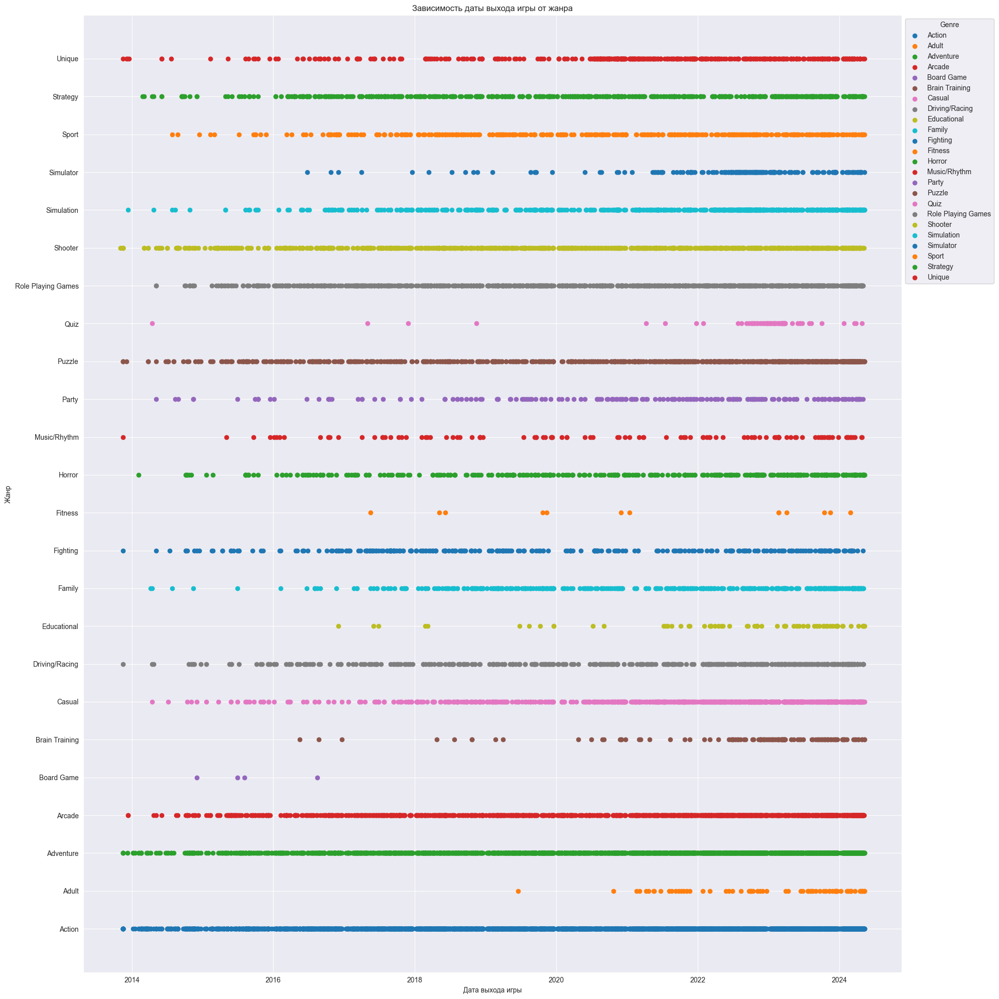

In [89]:
df['release_date'] = pd.to_datetime(df['release_date'])
df_exploded = df.explode('genres')

plt.figure(figsize = (20, 20))
for genre, group in df_exploded.groupby('genres'):
    plt.scatter(group['release_date'], group['genres'], label = genre)

plt.title('Зависимость даты выхода игры от жанра')
plt.xlabel('Дата выхода игры')
plt.ylabel('Жанр')
plt.grid(True)

plt.legend(title = 'Genre', loc = 'upper left', bbox_to_anchor = (1, 1))
plt.tight_layout()
plt.show()

### Зависимость даты выхода игры от платформы

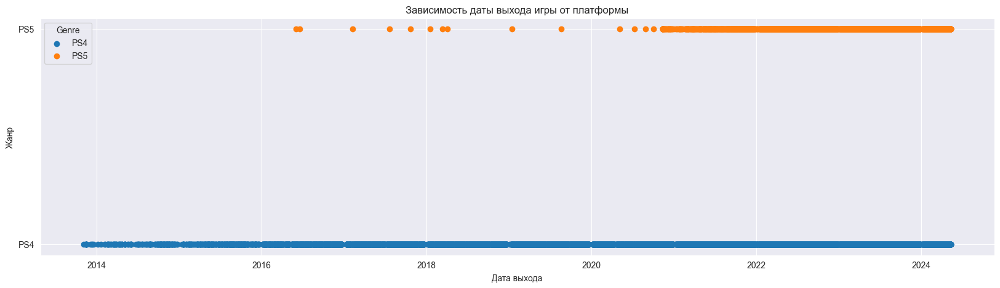

In [90]:
df['release_date'] = pd.to_datetime(df['release_date'])

df_exploded = df.explode('platforms')

plt.figure(figsize = (20, 5))
for genre, group in df_exploded.groupby('platforms'):
    plt.scatter(group['release_date'], group['platforms'], label = genre)

plt.title('Зависимость даты выхода игры от платформы')
plt.xlabel('Дата выхода')
plt.ylabel('Жанр')
plt.legend(title = 'Genre')
plt.grid(True)
plt.show()

## Зависимости жанров от других переменных

### Зависимость жанра от платформы

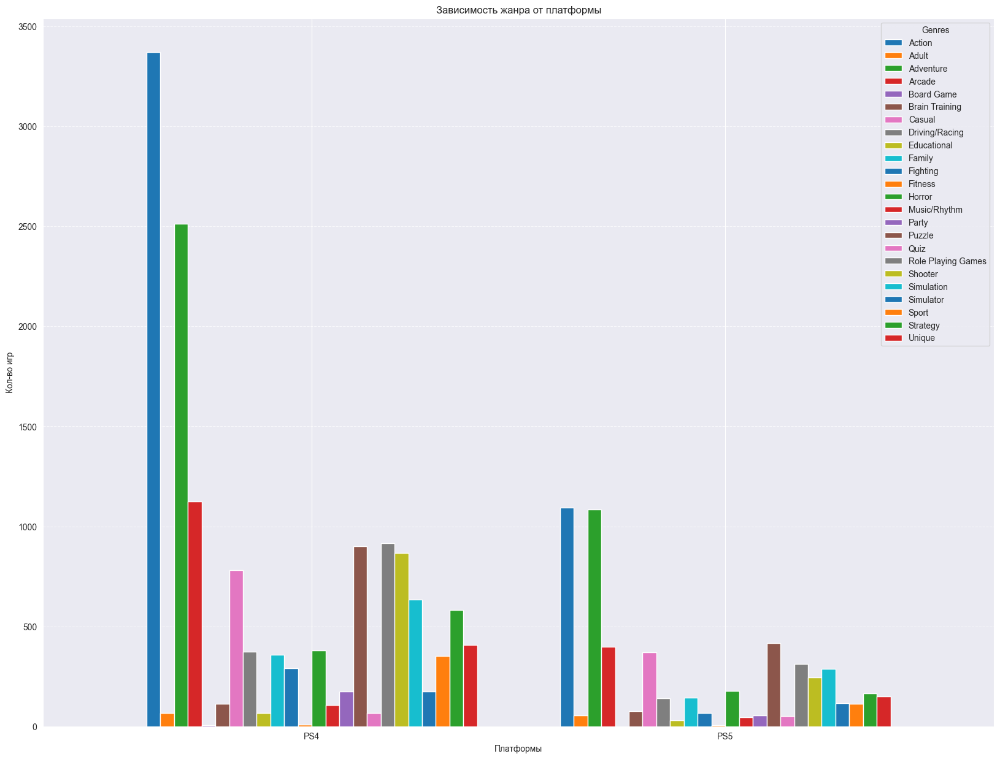

In [91]:
df_expanded = df.explode("platforms").explode("genres")

platform_genre_counts = df_expanded.groupby(['platforms', 'genres']).size().unstack(fill_value = 0)

ax = platform_genre_counts.plot(kind = 'bar', figsize = (20, 15), rot = 0, width = 0.8)
plt.title('Зависимость жанра от платформы')
plt.xlabel('Платформы')
plt.ylabel('Кол-во игр')
plt.legend(title = 'Genres')
plt.grid(axis = 'y', linestyle = '--', alpha = 0.7)

plt.show()

# Гипотезы